In [11]:
# from google.colab import drive
# drive.mount('/content/drive')
import pandas as pd
# データセットのパスを指定して読み込み
# file_path = '/content/drive/MyDrive/AI in Finance/pep.us.csv'
file_path = './pep.us.csv'
data = pd.read_csv(file_path)
# データの先頭を表示して確認
data.tail()

,Date,Open,High,Low,Close,Volume,OpenInt
10302,2017-11-06,109.97,110.000,109.19,109.26,3331765,0
10303,2017-11-07,109.15,110.470,109.15,110.47,3882043,0
10304,2017-11-08,110.57,112.040,110.50,112.00,3684289,0
10305,2017-11-09,111.35,112.440,111.02,111.48,2856898,0
10306,2017-11-10,111.44,112.975,111.31,112.75,3699254,0


In [ ]:
# 記述統計の生成
descriptive_stats = data.describe()
descriptive_stats

,Open,High,Low,Close,Volume,OpenInt
count,10307.000000,10307.000000,10307.000000,10307.000000,1.030700e+04,10307.0
mean,31.027409,31.290304,30.787360,31.052103,5.258948e+06,0.0
std,29.097644,29.264973,28.939995,29.110605,3.399219e+06,0.0
min,0.879100,0.895400,0.879100,0.879100,0.000000e+00,0.0
25%,4.255300,4.337100,4.173000,4.255300,3.231774e+06,0.0
50%,26.148000,26.639000,25.902000,26.302000,4.551820e+06,0.0
75%,50.005000,50.421500,49.616000,50.062000,6.417172e+06,0.0
max,118.170000,118.560000,117.990000,118.270000,5.619812e+07,0.0


In [ ]:
# データの欠損値を確認
missing_values = data.isnull().sum()
missing_values

Date       0
Open       0
High       0
Low        0
Close      0
Volume     0
OpenInt    0
dtype: int64

In [ ]:
# データ型の確認
data.dtypes

Date        object
Open       float64
High       float64
Low        float64
Close      float64
Volume       int64
OpenInt      int64
dtype: object

In [5]:
import plotly.express as px

# Date列を日付型に変換
data['Date'] = pd.to_datetime(data['Date'])

# 始値と終値の推移
fig_open_close = px.line(data, x='Date', y=['Open', 'Close'], title='始値と終値の推移')
fig_open_close.update_yaxes(title_text='Price')  # Y軸のラベルを設定
fig_open_close.show()

In [6]:
# 取引量の推移
plt.figure(figsize=(14, 7))
plt.plot(data['Date'], data['Volume'], label='Volume', color='orange')
plt.title('取引量の推移')
plt.xlabel('Date')
plt.ylabel('Volume')
plt.legend()
plt.grid(True)
plt.show()

NameError: name 'plt' is not defined

・・・のため、2000年以降のデータで以後、分析していく

In [7]:
# Date列を日付型に変換
data['Date'] = pd.to_datetime(data['Date'])

# フィルタリングする日付を指定（2000年1月1日以降）
start_date = '2000-01-01'

# データをフィルタリング
filtered_data = data[data['Date'] >= start_date]

# 始値と終値の推移をプロット
fig_open_close = px.line(filtered_data, x='Date', y=['Open', 'Close'], title='始値と終値の推移')
fig_open_close.update_yaxes(title_text='Price')  # Y軸のラベルを設定
fig_open_close.show()

In [14]:
import plotly.graph_objs as go

# 5日間、25日間、50日間の移動平均を計算
data['MA_5'] = data['Close'].rolling(window=5).mean()
data['MA_25'] = data['Close'].rolling(window=25).mean()
data['MA_50'] = data['Close'].rolling(window=50).mean()

# 結果の確認
print(data[['Date', 'Close', 'MA_5', 'MA_25', 'MA_50']].head(60))

# 移動平均のプロット
fig = go.Figure()

# Closeの実データを追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['Close'], mode='lines', name='Close'))

# 5日間の移動平均を追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['MA_5'], mode='lines', name='5-day MA'))

# 25日間の移動平均を追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['MA_25'], mode='lines', name='25-day MA'))

# 50日間の移動平均を追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['MA_50'], mode='lines', name='50-day MA'))

# レイアウト設定
fig.update_layout(title='Close Price and Moving Averages', xaxis_title='Date', yaxis_title='Price')

# プロット表示
fig.show()


         Date   Close     MA_5     MA_25     MA_50
0  1977-01-03  1.1746      NaN       NaN       NaN
1  1977-01-04  1.1584      NaN       NaN       NaN
2  1977-01-05  1.1499      NaN       NaN       NaN
3  1977-01-06  1.1584      NaN       NaN       NaN
4  1977-01-07  1.1499  1.15824       NaN       NaN
5  1977-01-10  1.1584  1.15500       NaN       NaN
6  1977-01-11  1.1417  1.15166       NaN       NaN
7  1977-01-12  1.1417  1.15002       NaN       NaN
8  1977-01-13  1.1584  1.15002       NaN       NaN
9  1977-01-14  1.1417  1.14838       NaN       NaN
10 1977-01-17  1.1334  1.14338       NaN       NaN
11 1977-01-18  1.1255  1.14014       NaN       NaN
12 1977-01-19  1.1087  1.13354       NaN       NaN
13 1977-01-20  1.1008  1.12202       NaN       NaN
14 1977-01-21  1.1008  1.11384       NaN       NaN
15 1977-01-24  1.0924  1.10564       NaN       NaN
16 1977-01-25  1.0845  1.09744       NaN       NaN
17 1977-01-26  1.0597  1.08764       NaN       NaN
18 1977-01-27  1.0431  1.07610 

主要な観察点
全体的なトレンド:

株価は長期的に見ると上昇トレンドにあります。特に2000年代以降、上昇が顕著です。
短期的な変動の抑制:

5日間の移動平均（青線）は価格の短期的な変動に非常に敏感で、価格の動きにほぼ追随しています。
25日間の移動平均（緑線）は5日間の移動平均に比べて滑らかで、短期的なノイズが除かれています。
50日間の移動平均（紫線）はさらに滑らかで、長期的なトレンドを示すのに適しています。
価格の変動範囲:

移動平均線が価格の変動範囲内にあることがわかります。特に50日間の移動平均は、価格が大きく乖離することが少なく、全体的なトレンドを示しています。
トレンドの変化:

価格が5日間、25日間、50日間の移動平均線を上回るか下回ることで、トレンドの変化を示しています。例えば、価格が50日間の移動平均を上回ると、長期的な上昇トレンドが続く可能性が高いです。
トレンドの強さと継続性:

25日間と50日間の移動平均線の乖離が大きくなると、トレンドの強さを示しています。一方、移動平均線が収束する場合は、トレンドが弱まり、反転の可能性があることを示唆します。
具体的なインサイト
トレンドフォロー:

長期的な投資戦略として、50日間の移動平均を基にトレンドフォロー戦略を検討できます。例えば、価格が50日間の移動平均を上回った場合に買い、下回った場合に売るという戦略です。
短期的な売買シグナル:

5日間の移動平均と25日間の移動平均のクロスオーバーを短期的な売買シグナルとして使用できます。例えば、5日間の移動平均が25日間の移動平均を上回った場合に買い、下回った場合に売るという戦略です。
ノイズの抑制:

短期的な価格変動を抑制し、長期的なトレンドを把握するために、50日間の移動平均を使用します。これにより、投資判断がより一貫性を持つことができます。
結論
このグラフは、価格の変動を滑らかにし、トレンドを明確にするために移動平均がどのように機能するかを示しています。短期、中期、長期の移動平均を組み合わせることで、価格の変動を多角的に分析し、より精度の高い投資判断を行うことができます。

In [15]:
# 5日間、25日間、50日間の移動標準偏差を計算
data['STD_5'] = data['Close'].rolling(window=5).std()
data['STD_25'] = data['Close'].rolling(window=25).std()
data['STD_50'] = data['Close'].rolling(window=50).std()

# 移動標準偏差のプロット
fig = go.Figure()

# Closeの実データを追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['Close'], mode='lines', name='Close'))

# 5日間の移動標準偏差を追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['STD_5'], mode='lines', name='5-day STD'))

# 25日間の移動標準偏差を追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['STD_25'], mode='lines', name='25-day STD'))

# 50日間の移動標準偏差を追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['STD_50'], mode='lines', name='50-day STD'))

# レイアウト設定
fig.update_layout(title='Close Price and Moving Standard Deviations', xaxis_title='Date', yaxis_title='Value')

# プロット表示
fig.show()

このグラフでは、株価の終値（Close）と異なる期間の移動標準偏差（5日間、25日間、50日間）が示されています。このグラフから得られる洞察を以下にまとめます。

### 洞察1: 短期的な変動性の評価
- **5日間の移動標準偏差**（5-day STD）は、価格の短期的な変動性を示しています。5日間の移動標準偏差が高い時期は、短期間で価格が急激に変動していることを示します。
- グラフを見ると、価格の急激な変動がある期間（例えばリーマンショック時期やコロナショック時期）に5日間の移動標準偏差が高くなっていることがわかります。

### 洞察2: 中期的な変動性の評価
- **25日間の移動標準偏差**（25-day STD）は、中期的な変動性を示しています。25日間の移動標準偏差が高い時期は、中期間で価格が大きく変動していることを示します。
- この標準偏差は、5日間のものよりも滑らかで、短期的なノイズが少なく、中期的なトレンドを示すのに適しています。

### 洞察3: 長期的な変動性の評価
- **50日間の移動標準偏差**（50-day STD）は、長期的な変動性を示しています。50日間の移動標準偏差が高い時期は、長期間で価格が大きく変動していることを示します。
- グラフ上では、50日間の移動標準偏差は他の期間よりもさらに滑らかで、長期的なトレンドの変動性を示しています。

### 洞察4: 市場の安定性の評価
- **長期的な安定性**：50日間の移動標準偏差が低い期間は、市場が長期間にわたって安定していることを示します。
- グラフでは、1970年代から1990年代初期にかけては比較的安定しているが、その後、特に2000年代以降、変動性が増加していることがわかります。

### 洞察5: 特定のイベントの影響
- 特定のイベントが市場に与える影響を評価することができます。例えば、リーマンショック（2008年頃）やコロナショック（2020年初頭）の期間に、すべての移動標準偏差が急上昇していることがわかります。これらの期間は市場の不安定性が非常に高かったことを示しています。

### 結論
このグラフから、異なる期間の移動標準偏差を分析することで、価格の変動性、リスク、および市場の安定性について詳細な洞察を得ることができます。短期、中期、長期の変動性を理解することで、投資戦略を調整し、リスク管理を強化することが可能です。具体的には、以下のようなアクションを検討できます：

1. **短期的な変動に対するトレード戦略**：短期的な急激な変動を利用したトレーディング戦略を検討する。
2. **リスク管理**：高い標準偏差の期間を避けるか、リスク管理を強化する。
3. **トレンドフォロー**：長期的なトレンドに基づいた投資戦略を策定する。

In [16]:
# ボリンジャーバンドの計算
for window in [5, 25, 50]:
    data[f'MA_{window}'] = data['Close'].rolling(window=window).mean()
    data[f'STD_{window}'] = data['Close'].rolling(window=window).std()
    data[f'Upper_Band_{window}'] = data[f'MA_{window}'] + (data[f'STD_{window}'] * 2)
    data[f'Lower_Band_{window}'] = data[f'MA_{window}'] - (data[f'STD_{window}'] * 2)

# ボリンジャーバンドのプロット
fig = go.Figure()

# Closeの実データを追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['Close'], mode='lines', name='Close'))

# 5日間のボリンジャーバンドを追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['Upper_Band_5'], mode='lines', name='5-day Upper Band'))
fig.add_trace(go.Scatter(x=data['Date'], y=data['Lower_Band_5'], mode='lines', name='5-day Lower Band'))

# 25日間のボリンジャーバンドを追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['Upper_Band_25'], mode='lines', name='25-day Upper Band'))
fig.add_trace(go.Scatter(x=data['Date'], y=data['Lower_Band_25'], mode='lines', name='25-day Lower Band'))

# 50日間のボリンジャーバンドを追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['Upper_Band_50'], mode='lines', name='50-day Upper Band'))
fig.add_trace(go.Scatter(x=data['Date'], y=data['Lower_Band_50'], mode='lines', name='50-day Lower Band'))

# レイアウト設定
fig.update_layout(title='Bollinger Bands for Different Periods', xaxis_title='Date', yaxis_title='Price')

# プロット表示
fig.show()

In [17]:
# MACDの計算
short_window = 12
long_window = 26
signal_window = 9

data['EMA_short'] = data['Close'].ewm(span=short_window, adjust=False).mean()
data['EMA_long'] = data['Close'].ewm(span=long_window, adjust=False).mean()
data['MACD'] = data['EMA_short'] - data['EMA_long']
data['MACD_signal'] = data['MACD'].ewm(span=signal_window, adjust=False).mean()

fig = go.Figure()

# MACDを追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['MACD'], mode='lines', name='MACD'))

# MACDシグナルを追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['MACD_signal'], mode='lines', name='MACD Signal'))

# レイアウト設定
fig.update_layout(title='MACD', xaxis_title='Date', yaxis_title='Value')

# プロット表示
fig.show()

In [18]:
# RSIの計算
def compute_RSI(data, window=14):
    delta = data['Close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    RS = gain / loss
    RSI = 100 - (100 / (1 + RS))
    return RSI

data['RSI'] = compute_RSI(data)

fig = go.Figure()

# RSIを追加
fig.add_trace(go.Scatter(x=data['Date'], y=data['RSI'], mode='lines', name='RSI'))

# レイアウト設定
fig.update_layout(title='RSI', xaxis_title='Date', yaxis_title='Value')

# プロット表示
fig.show()


### ボリンジャーバンドの視覚化結果からの洞察

1. **価格のボラティリティの評価**:
   - 異なる期間のボリンジャーバンドを比較することで、価格のボラティリティを評価できます。ボリンジャーバンドが広がっている期間はボラティリティが高いことを示し、狭まっている期間はボラティリティが低いことを示します。例えば、2008年のリーマンショックや2020年のコロナショックの際に、バンドが大きく広がっているのが見て取れます。

2. **価格の動きの捕捉**:
   - 価格が上位バンドに近づくと、オーバーボート（買われ過ぎ）を示し、下位バンドに近づくとオーバーソールド（売られ過ぎ）を示します。異なる期間のボリンジャーバンドを観察することで、短期的なトレード機会や長期的なトレンドの変化を捉えることができます。

3. **期間ごとの比較**:
   - 短期（5日間）、中期（25日間）、長期（50日間）のボリンジャーバンドを比較することで、期間ごとの価格動向を把握できます。短期的なトレンドと長期的なトレンドを区別し、それぞれのトレンドに対する異なる投資戦略を検討することが可能です。

### MACDの視覚化結果からの洞察

1. **トレンドの強さと方向性**:
   - MACDとそのシグナルラインを比較することで、トレンドの強さと方向性を評価できます。MACDがシグナルラインを上回ると上昇トレンド、下回ると下降トレンドを示します。これにより、売買シグナルを確認することができます。

2. **ヒストグラムの確認**:
   - MACDとシグナルラインの差をヒストグラムとして表示することもできます。ヒストグラムがプラスの場合は強い上昇トレンド、マイナスの場合は強い下降トレンドを示します。この視覚化はトレンドの変化を早期に捉えるのに役立ちます。

3. **市場の変動性**:
   - MACDの変動が激しい期間は市場の変動性が高いことを示し、安定している期間は市場が比較的安定していることを示します。特にリーマンショックやコロナショックの際には大きな変動が見られます。

### RSIの視覚化結果からの洞察

1. **オーバーボートとオーバーソールドの検出**:
   - RSIは70以上でオーバーボート（買われ過ぎ）、30以下でオーバーソールド（売られ過ぎ）を示します。これにより、反転の可能性が高いポイントを検出することができます。例えば、急激な上昇や下降がある場合、その後の反転を予測するのに役立ちます。

2. **市場の勢いの評価**:
   - RSIは市場の勢いを示す指標としても機能します。RSIが50以上であれば上昇トレンド、50以下であれば下降トレンドを示します。トレンドの強さや持続性を評価するのに役立ちます。

3. **トレンドフォローの補助**:
   - RSIを使用してトレンドフォロー戦略の補助とすることができます。例えば、RSIが70を超えた後に再度70を下回ると売りシグナル、30を下回った後に再度30を上回ると買いシグナルとなります。

### 結論

これらの視覚化分析を通じて、価格の変動性、トレンドの強さ、オーバーボート・オーバーソールドの状態、そして市場の勢いを多角的に評価することができます。それぞれの指標を組み合わせることで、より精度の高い投資判断やリスク管理が可能となります。

In [20]:
import pandas as pd

# データセットのパスを指定して読み込み
file_path = './pep.us.csv'
data = pd.read_csv(file_path)

# 'Date'列を日付型に変換
data['Date'] = pd.to_datetime(data['Date'])

# データの期間を表示
start_date = data['Date'].min()
end_date = data['Date'].max()

print(f"データの期間: {start_date.date()} から {end_date.date()} まで")


データの期間: 1977-01-03 から 2017-11-10 まで


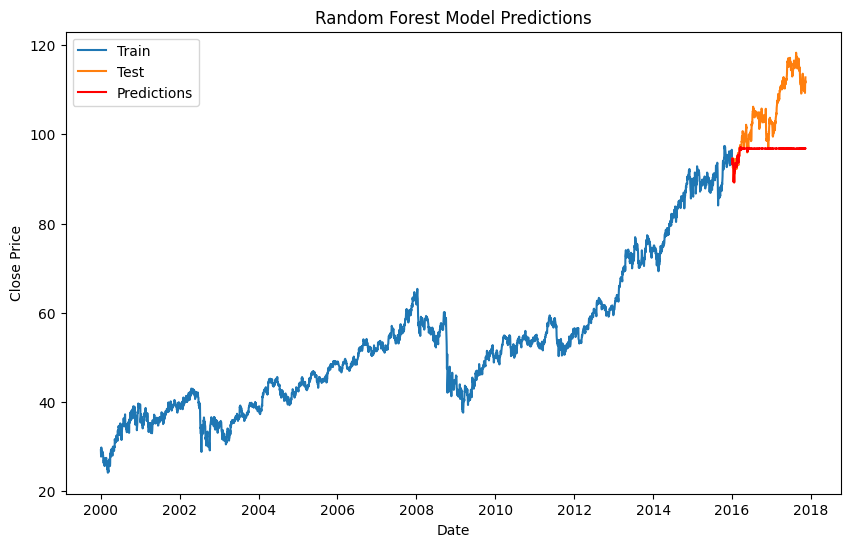

Mean Squared Error: 120.32263916721429


In [21]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# データセットの読み込み
file_path = './pep.us.csv'
data = pd.read_csv(file_path)

# 'Date'列を日付型に変換し、インデックスに設定
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)

# 2000年から2015年の訓練データと2016年から2017年11月10日のテストデータに分割
train_data = data['2000':'2015']
test_data = data['2016':'2017-11-10']

# 特徴量とターゲット変数に分割
X_train = train_data.drop('Close', axis=1)
y_train = train_data['Close']
X_test = test_data.drop('Close', axis=1)
y_test = test_data['Close']

# ランダムフォレストモデルの訓練
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# 予測
predictions = model.predict(X_test)

# 予測と実際のデータのプロット
plt.figure(figsize=(10,6))
plt.plot(train_data.index, y_train, label='Train')
plt.plot(test_data.index, y_test, label='Test')
plt.plot(test_data.index, predictions, label='Predictions', color='red')
plt.title('Random Forest Model Predictions')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

# 精度評価
mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')


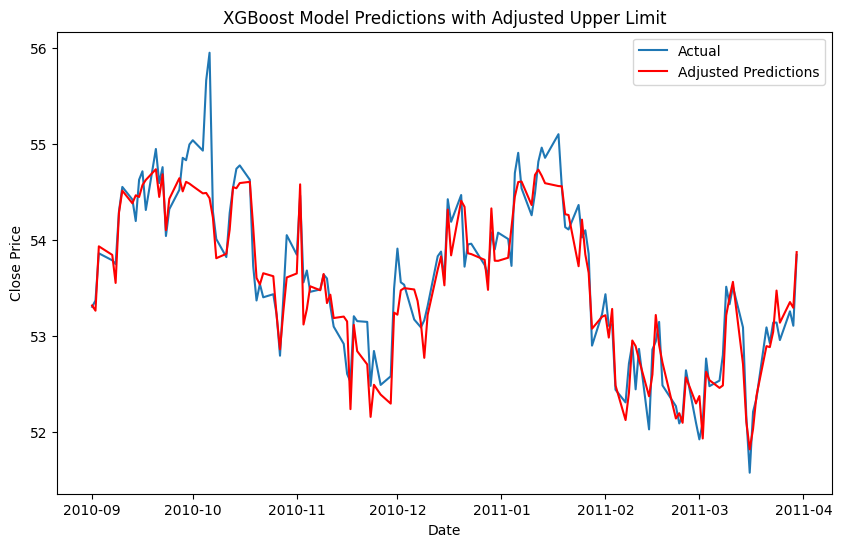

Mean Squared Error: 0.08218194606189509


In [16]:
import pandas as pd
import numpy as np
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler

# データセットの読み込み
file_path = './pep.us.csv'
data = pd.read_csv(file_path)

# 'Date'列を日付型に変換し、インデックスに設定
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)

# 遅行変数を作成
for lag in [1, 2, 3, 5, 10, 20]:
    data[f'Close_lag_{lag}'] = data['Close'].shift(lag)

# 移動平均を追加
data['Close_ma_10'] = data['Close'].rolling(window=10).mean()
data['Close_ma_30'] = data['Close'].rolling(window=30).mean()

# ボラティリティを追加
data['Close_volatility'] = data['Close'].rolling(window=10).std()

# 欠損値を削除
data = data.dropna()

# 訓練データとテストデータに分割

train_data = data.loc['2010-01-01':'2010-08-31']
test_data = data.loc['2010-09-01':'2011-03-30']

# 特徴量とターゲット変数に分割
X_train = train_data.drop('Close', axis=1)
y_train = train_data['Close']
X_test = test_data.drop('Close', axis=1)
y_test = test_data['Close']

# 特徴量のスケーリング
feature_scaler = MinMaxScaler(feature_range=(0, 1.5))
X_train_scaled = feature_scaler.fit_transform(X_train)
X_test_scaled = feature_scaler.transform(X_test)

# ターゲット変数のスケーリング
target_scaler = MinMaxScaler(feature_range=(0, 1.5))
y_train_scaled = target_scaler.fit_transform(y_train.values.reshape(-1, 1))

# XGBoostモデルの訓練
model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, max_depth=5, learning_rate=0.1)
model.fit(X_train_scaled, y_train_scaled.ravel())

# 予測
predictions_scaled = model.predict(X_test_scaled)

# 予測値のスケーリングを逆にする
predictions = target_scaler.inverse_transform(predictions_scaled.reshape(-1, 1))

# 予測値の範囲を調整する
max_value = 1.5 * np.max(y_train)
adjusted_predictions = np.clip(predictions, None, max_value)

# 予測と実際のデータのプロット（テスト期間のみ）
plt.figure(figsize=(10,6))
plt.plot(test_data.index, y_test, label='Actual')
plt.plot(test_data.index, adjusted_predictions, label='Adjusted Predictions', color='red')
plt.title('XGBoost Model Predictions with Adjusted Upper Limit')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

# 精度評価
mse = mean_squared_error(y_test, adjusted_predictions)
print(f'Mean Squared Error: {mse}')


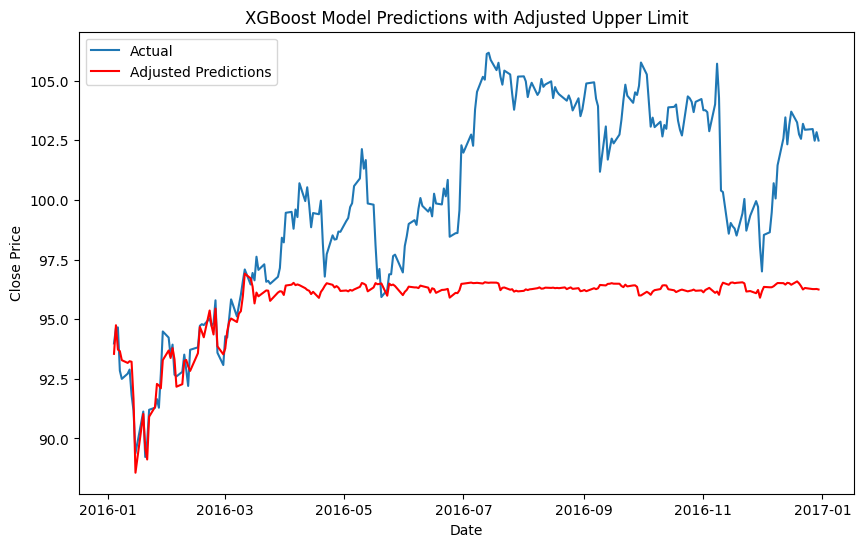

Mean Squared Error: 28.542956873643234


In [11]:
import pandas as pd
import numpy as np
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler

# データセットの読み込み
file_path = './pep.us.csv'
data = pd.read_csv(file_path)

# 'Date'列を日付型に変換し、インデックスに設定
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)

# 遅行変数を作成
for lag in [1, 2, 3, 5, 10, 20]:
    data[f'Close_lag_{lag}'] = data['Close'].shift(lag)

# 移動平均を追加
data['Close_ma_10'] = data['Close'].rolling(window=10).mean()
data['Close_ma_30'] = data['Close'].rolling(window=30).mean()

# ボラティリティを追加
data['Close_volatility'] = data['Close'].rolling(window=10).std()

# 欠損値を削除
data = data.dropna()

# 訓練データとテストデータに分割
train_data = data.loc['2010-01-01':'2015-12-31']
test_data = data.loc['2016-01-01':'2016-12-31']

# 特徴量とターゲット変数に分割
X_train = train_data.drop('Close', axis=1)
y_train = train_data['Close']
X_test = test_data.drop('Close', axis=1)
y_test = test_data['Close']

# 特徴量のスケーリング
feature_scaler = MinMaxScaler(feature_range=(0, 1.5))
X_train_scaled = feature_scaler.fit_transform(X_train)
X_test_scaled = feature_scaler.transform(X_test)

# ターゲット変数のスケーリング
target_scaler = MinMaxScaler(feature_range=(0, 1.5))
y_train_scaled = target_scaler.fit_transform(y_train.values.reshape(-1, 1))

# XGBoostモデルの訓練
model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, max_depth=5, learning_rate=0.2)  # 学習率を上げる
model.fit(X_train_scaled, y_train_scaled.ravel())

# 予測
predictions_scaled = model.predict(X_test_scaled)

# 予測値のスケーリングを逆にする
predictions = target_scaler.inverse_transform(predictions_scaled.reshape(-1, 1))

# 予測値の範囲を調整する
max_value = 1.5 * np.max(y_train)
adjusted_predictions = np.clip(predictions, None, max_value)

# 予測と実際のデータのプロット（テスト期間のみ）
plt.figure(figsize=(10,6))
plt.plot(test_data.index, y_test, label='Actual')
plt.plot(test_data.index, adjusted_predictions, label='Adjusted Predictions', color='red')
plt.title('XGBoost Model Predictions with Adjusted Upper Limit')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

# 精度評価
mse = mean_squared_error(y_test, adjusted_predictions)
print(f'Mean Squared Error: {mse}')


In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.metrics import mean_squared_error

# データセットの読み込み
file_path = './pep.us.csv'
data = pd.read_csv(file_path)

# 'Date'列を日付型に変換し、インデックスに設定
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)

# Close列の値をスケーリング
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data[['Close']])

# 訓練データとテストデータに分割
train_data = scaled_data['2006-01-01' < data.index < '2016-01-01']
test_data = scaled_data[data.index >= '2016-01-01']

# データをLSTMの入力形式に変換
def create_dataset(data, time_step=1):
    X, Y = [], []
    for i in range(len(data) - time_step - 1):
        a = data[i:(i + time_step), 0]
        X.append(a)
        Y.append(data[i + time_step, 0])
    return np.array(X), np.array(Y)

time_step = 60
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

# LSTMの入力形式に合わせてリシェイプ
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

# LSTMモデルの作成
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step, 1)))
model.add(LSTM(50, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# モデルのコンパイルと訓練
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(X_train, y_train, batch_size=1, epochs=10)  # エポック数を増やす

# 予測と逆スケーリング
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)
train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)

# 予測と実際のデータのプロット
plt.figure(figsize=(10,6))
plt.plot(data.index, scaler.inverse_transform(scaled_data), label='Actual')
plt.plot(data.index[time_step:len(train_predict)+time_step], train_predict, label='Train Predictions', color='green')
plt.plot(data.index[len(train_predict)+(time_step*2)+1:len(scaled_data)-1], test_predict, label='Test Predictions', color='red')
plt.title('LSTM Model Predictions')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

# 精度評価
rmse = np.sqrt(mean_squared_error(scaler.inverse_transform(y_test.reshape(-1, 1)), test_predict))
print(f'Root Mean Squared Error: {rmse}')



A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.0 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "c:\Users\takah\anaconda3\envs\FinanceTradeEmvironment_p3119\Lib\site-packages\ipykernel_launcher.py", line 17, in <module>
    app.launch_new_instance()
  File "c:\Users\takah\anaconda3\envs\FinanceTradeEmvironment_p3119\Lib\site-packages\traitlets\config\application.py", line 1075, in launch_instance
    app.start()
  File "c:\Users\takah\anaconda3\envs\FinanceTradeEmvironment_p3119\Lib\site-packages\ipykernel\

AttributeError: _ARRAY_API not found


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.0 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "c:\Users\takah\anaconda3\envs\FinanceTradeEmvironment_p3119\Lib\site-packages\ipykernel_launcher.py", line 17, in <module>
    app.launch_new_instance()
  File "c:\Users\takah\anaconda3\envs\FinanceTradeEmvironment_p3119\Lib\site-packages\traitlets\config\application.py", line 1075, in launch_instance
    app.start()
  File "c:\Users\takah\anaconda3\envs\FinanceTradeEmvironment_p3119\Lib\site-packages\ipykernel\

AttributeError: _ARRAY_API not found


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.0 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "c:\Users\takah\anaconda3\envs\FinanceTradeEmvironment_p3119\Lib\site-packages\ipykernel_launcher.py", line 17, in <module>
    app.launch_new_instance()
  File "c:\Users\takah\anaconda3\envs\FinanceTradeEmvironment_p3119\Lib\site-packages\traitlets\config\application.py", line 1075, in launch_instance
    app.start()
  File "c:\Users\takah\anaconda3\envs\FinanceTradeEmvironment_p3119\Lib\site-packages\ipykernel\

AttributeError: _ARRAY_API not found

ImportError: numpy.core._multiarray_umath failed to import

ImportError: numpy.core.umath failed to import

Fitting 5 folds for each of 108 candidates, totalling 540 fits


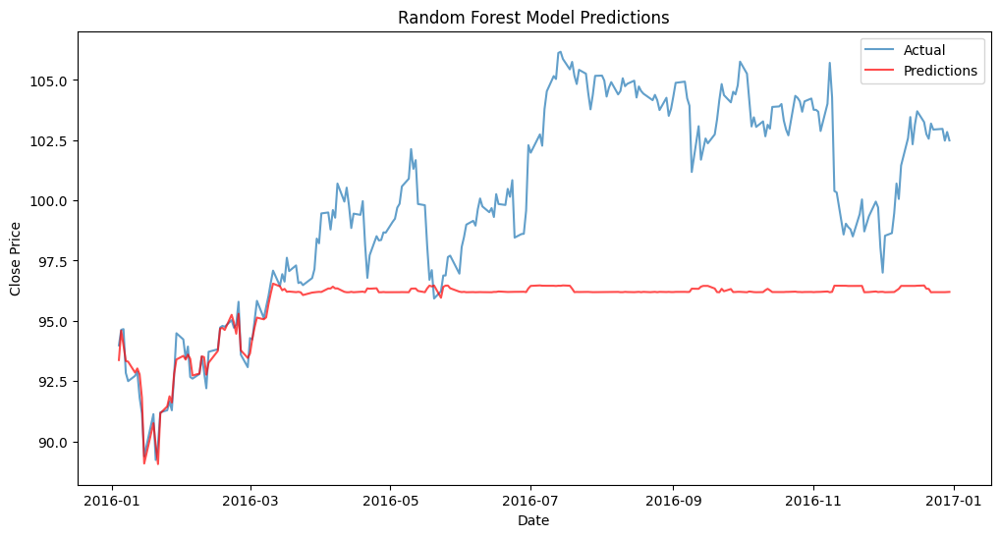

Mean Squared Error: 28.922838820752347
Root Mean Squared Error: 5.3779957996220435
Best parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

Feature Importance:
             feature  importance
1               High    0.703926
2                Low    0.244245
0               Open    0.039000
6        Close_lag_2    0.002959
11       Close_ma_10    0.002652
13  Close_volatility    0.001537
5        Close_lag_1    0.001090
12       Close_ma_30    0.001019
3             Volume    0.000837
9       Close_lag_10    0.000827
7        Close_lag_3    0.000703
8        Close_lag_5    0.000656
10      Close_lag_20    0.000549
4            OpenInt    0.000000


<Figure size 1000x600 with 0 Axes>

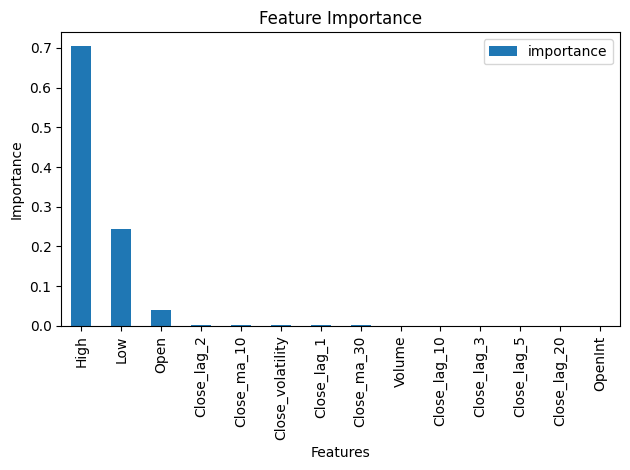

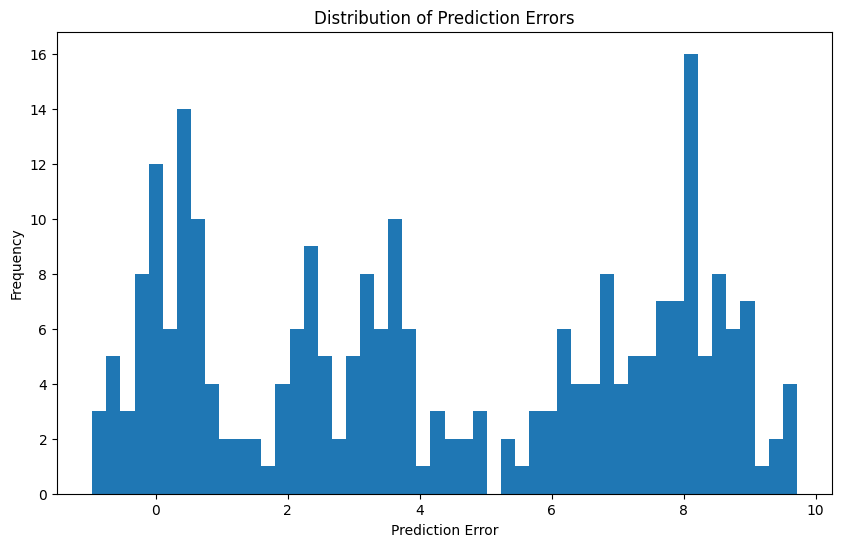

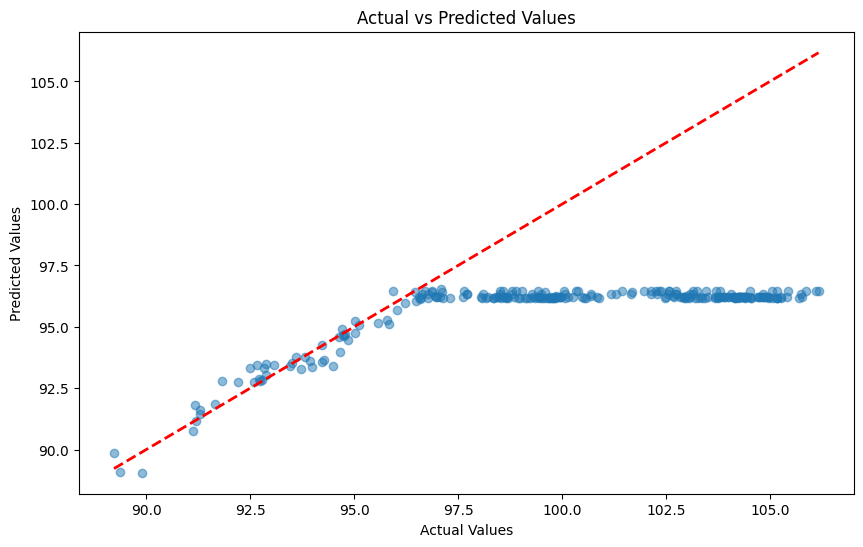

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV

# データセットの読み込みと前処理
file_path = './pep.us.csv'
data = pd.read_csv(file_path)
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)

for lag in [1, 2, 3, 5, 10, 20]:
    data[f'Close_lag_{lag}'] = data['Close'].shift(lag)

data['Close_ma_10'] = data['Close'].rolling(window=10).mean()
data['Close_ma_30'] = data['Close'].rolling(window=30).mean()
data['Close_volatility'] = data['Close'].rolling(window=10).std()

data = data.dropna()

# データの分割
train_data = data.loc['2010-01-01':'2015-12-31']
test_data = data.loc['2016-01-01':'2016-12-31']

X_train = train_data.drop('Close', axis=1)
y_train = train_data['Close']
X_test = test_data.drop('Close', axis=1)
y_test = test_data['Close']

# スケーリング
feature_scaler = MinMaxScaler(feature_range=(0, 1.5))
X_train_scaled = feature_scaler.fit_transform(X_train)
X_test_scaled = feature_scaler.transform(X_test)

target_scaler = MinMaxScaler(feature_range=(0, 1.5))
y_train_scaled = target_scaler.fit_transform(y_train.values.reshape(-1, 1))

# 指数関数的な重み付けを行う関数
def exponential_weights(n_samples, decay_factor=0.01):
    weights = np.exp(np.arange(n_samples) * decay_factor)
    return weights / np.sum(weights)

# 重み付けの適用
sample_weights = exponential_weights(len(y_train_scaled), decay_factor=0.01)

# ランダムフォレストのハイパーパラメータ設定
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# 時系列交差検証を設定
tscv = TimeSeriesSplit(n_splits=5)

# グリッドサーチによるハイパーパラメータのチューニング
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=tscv, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train_scaled.ravel(), sample_weight=sample_weights)

# 最適なモデルで予測
best_model = grid_search.best_estimator_
predictions_scaled = best_model.predict(X_test_scaled)

# 予測値のスケーリングを逆にする
predictions = target_scaler.inverse_transform(predictions_scaled.reshape(-1, 1))

# 予測と実際のデータのプロット（テスト期間のみ）
plt.figure(figsize=(12,6))
plt.plot(test_data.index, y_test, label='Actual', alpha=0.7)
plt.plot(test_data.index, predictions, label='Predictions', color='red', alpha=0.7)
plt.title('Random Forest Model Predictions')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

# 精度評価
mse = mean_squared_error(y_test, predictions)
rmse = np.sqrt(mse)
print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')

# 最適なパラメータの表示
print("Best parameters:", grid_search.best_params_)

# 特徴量の重要度を表示
feature_importance = pd.DataFrame({'feature': X_train.columns, 'importance': best_model.feature_importances_})
feature_importance = feature_importance.sort_values('importance', ascending=False)
print("\nFeature Importance:")
print(feature_importance)

# 特徴量の重要度をプロット
plt.figure(figsize=(10, 6))
feature_importance.plot(x='feature', y='importance', kind='bar')
plt.title('Feature Importance')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# 予測誤差の分布をプロット
errors = y_test - predictions.ravel()
plt.figure(figsize=(10, 6))
plt.hist(errors, bins=50)
plt.title('Distribution of Prediction Errors')
plt.xlabel('Prediction Error')
plt.ylabel('Frequency')
plt.show()

# 実際の値と予測値の散布図
plt.figure(figsize=(10, 6))
plt.scatter(y_test, predictions, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

Fitting 5 folds for each of 108 candidates, totalling 540 fits


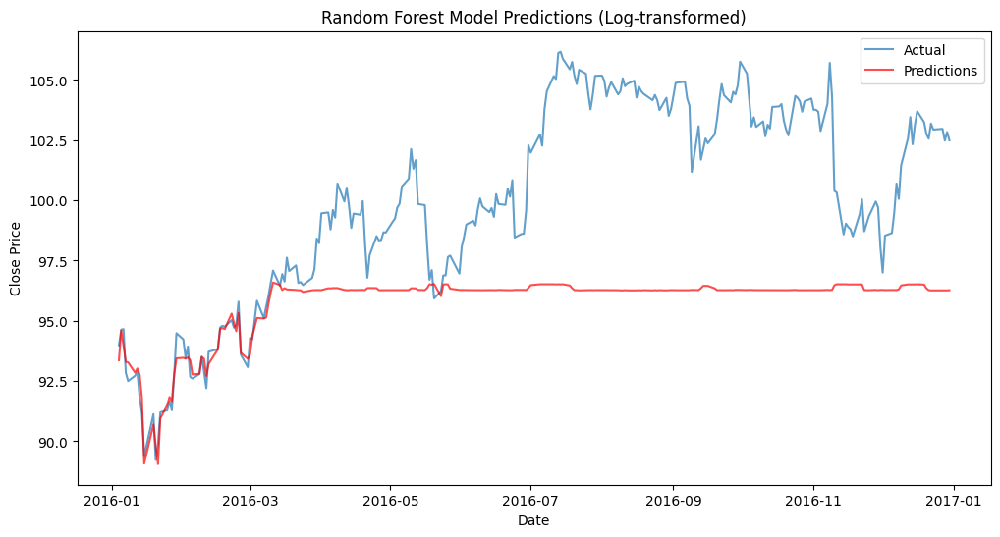

Mean Squared Error: 28.433963679602314
Root Mean Squared Error: 5.332350671102034
Best parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}

Feature Importance:
                 feature  importance
1                   High    0.651318
2                    Low    0.308590
0                   Open    0.010180
5        Log_Close_lag_1    0.007510
12       Log_Close_ma_30    0.006569
11       Log_Close_ma_10    0.006121
6        Log_Close_lag_2    0.004591
7        Log_Close_lag_3    0.001092
13  Log_Close_volatility    0.001088
9       Log_Close_lag_10    0.000948
8        Log_Close_lag_5    0.000901
3                 Volume    0.000718
10      Log_Close_lag_20    0.000376
4                OpenInt    0.000000


<Figure size 1000x600 with 0 Axes>

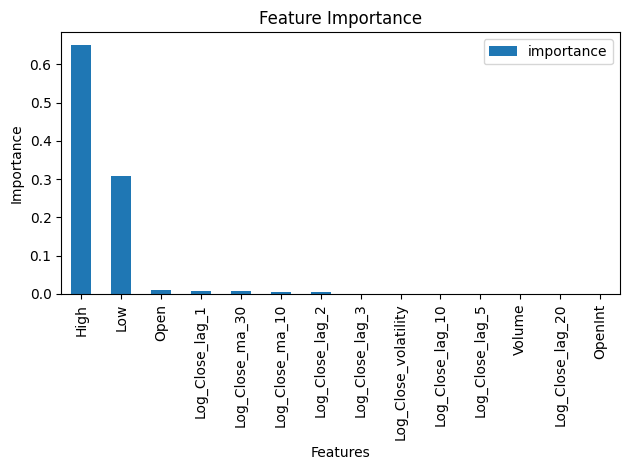

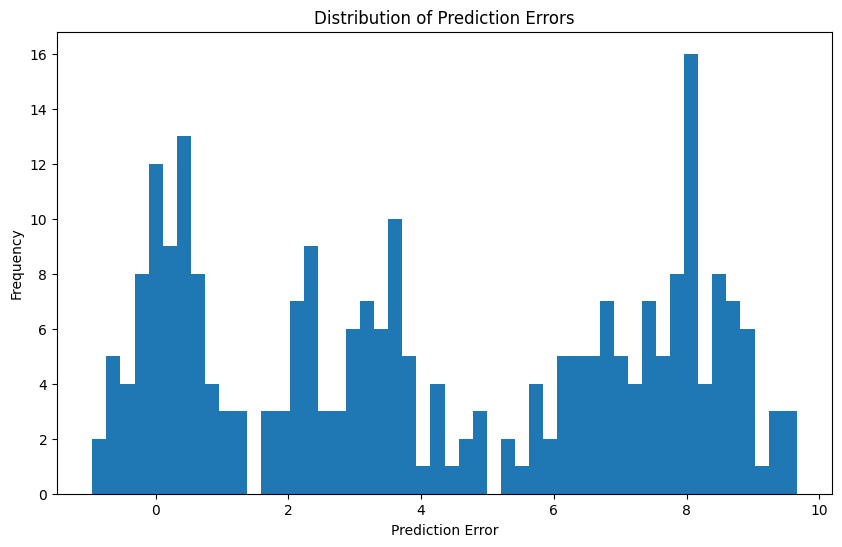

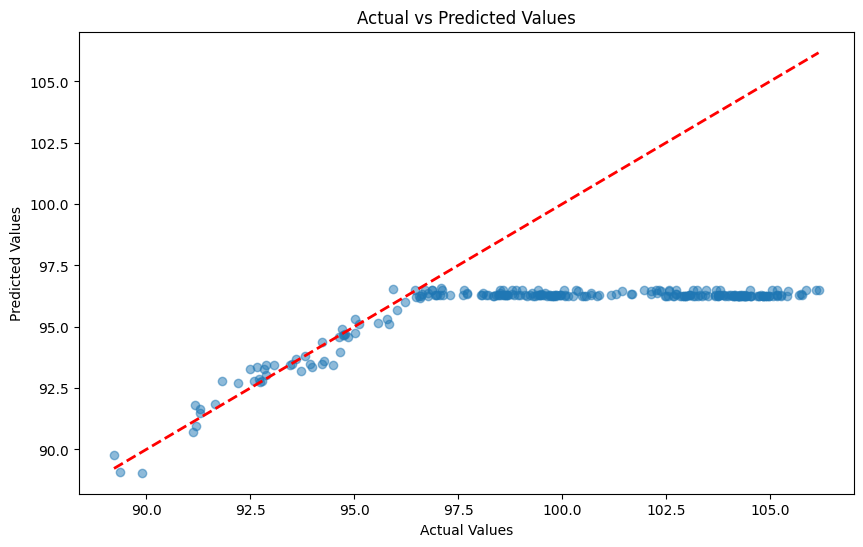

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV

# データセットの読み込みと前処理
file_path = './pep.us.csv'
data = pd.read_csv(file_path)
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)

# 対数変換を適用
data['Log_Close'] = np.log(data['Close'])

for lag in [1, 2, 3, 5, 10, 20]:
    data[f'Log_Close_lag_{lag}'] = data['Log_Close'].shift(lag)

data['Log_Close_ma_10'] = data['Log_Close'].rolling(window=10).mean()
data['Log_Close_ma_30'] = data['Log_Close'].rolling(window=30).mean()
data['Log_Close_volatility'] = data['Log_Close'].rolling(window=10).std()

data = data.dropna()

# データの分割
train_data = data.loc['2010-01-01':'2015-12-31']
test_data = data.loc['2016-01-01':'2016-12-31']

X_train = train_data.drop(['Close', 'Log_Close'], axis=1)
y_train = train_data['Log_Close']
X_test = test_data.drop(['Close', 'Log_Close'], axis=1)
y_test = test_data['Log_Close']

# スケーリング
feature_scaler = MinMaxScaler(feature_range=(0, 1.5))
X_train_scaled = feature_scaler.fit_transform(X_train)
X_test_scaled = feature_scaler.transform(X_test)

# 指数関数的な重み付けを行う関数
def exponential_weights(n_samples, decay_factor=0.01):
    weights = np.exp(np.arange(n_samples) * decay_factor)
    return weights / np.sum(weights)

# 重み付けの適用
sample_weights = exponential_weights(len(y_train), decay_factor=0.01)

# ランダムフォレストのハイパーパラメータ設定
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# 時系列交差検証を設定
tscv = TimeSeriesSplit(n_splits=5)

# グリッドサーチによるハイパーパラメータのチューニング
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=tscv, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train, sample_weight=sample_weights)

# 最適なモデルで予測
best_model = grid_search.best_estimator_
log_predictions = best_model.predict(X_test_scaled)

# 対数変換を元に戻す
predictions = np.exp(log_predictions)
actual_values = np.exp(y_test)

# 予測と実際のデータのプロット（テスト期間のみ）
plt.figure(figsize=(12,6))
plt.plot(test_data.index, actual_values, label='Actual', alpha=0.7)
plt.plot(test_data.index, predictions, label='Predictions', color='red', alpha=0.7)
plt.title('Random Forest Model Predictions (Log-transformed)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

# 精度評価
mse = mean_squared_error(actual_values, predictions)
rmse = np.sqrt(mse)
print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')

# 最適なパラメータの表示
print("Best parameters:", grid_search.best_params_)

# 特徴量の重要度を表示
feature_importance = pd.DataFrame({'feature': X_train.columns, 'importance': best_model.feature_importances_})
feature_importance = feature_importance.sort_values('importance', ascending=False)
print("\nFeature Importance:")
print(feature_importance)

# 特徴量の重要度をプロット
plt.figure(figsize=(10, 6))
feature_importance.plot(x='feature', y='importance', kind='bar')
plt.title('Feature Importance')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# 予測誤差の分布をプロット
errors = actual_values - predictions
plt.figure(figsize=(10, 6))
plt.hist(errors, bins=50)
plt.title('Distribution of Prediction Errors')
plt.xlabel('Prediction Error')
plt.ylabel('Frequency')
plt.show()

# 実際の値と予測値の散布図
plt.figure(figsize=(10, 6))
plt.scatter(actual_values, predictions, alpha=0.5)
plt.plot([actual_values.min(), actual_values.max()], [actual_values.min(), actual_values.max()], 'r--', lw=2)
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

Fitting 5 folds for each of 100 candidates, totalling 500 fits


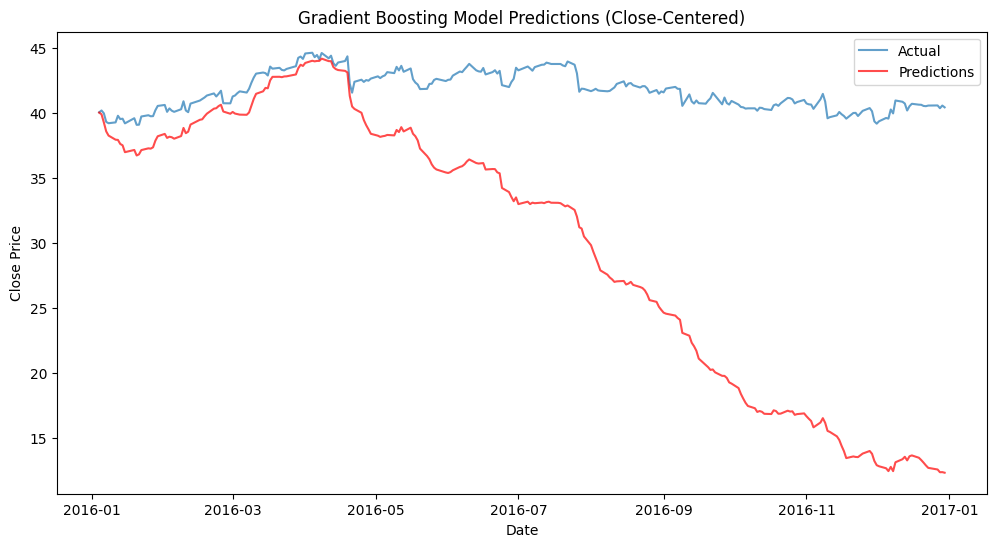

Mean Squared Error: 231.50219340575904
Root Mean Squared Error: 15.215196134317791
Mean Absolute Error: 11.735544860109774
R-squared: -112.05218534028647
Best parameters: {'learning_rate': 0.1370204442119109, 'max_depth': 3, 'max_features': None, 'min_samples_leaf': 11, 'min_samples_split': 18, 'n_estimators': 491, 'subsample': 0.8916028672163949}

Feature Importance:
                feature  importance
20  Close_to_MA10_ratio    0.347890
6      Close_diff_lag_1    0.102451
3                Volume    0.093856
19     Close_volatility    0.073149
5           Close_lag_1    0.069475
8      Close_diff_lag_2    0.060933
10     Close_diff_lag_3    0.047374
13         Close_lag_10    0.039151
21  Close_to_MA30_ratio    0.025448
15         Close_lag_20    0.022444
7           Close_lag_2    0.019127
18          Close_ma_30    0.018780
12     Close_diff_lag_5    0.017847
11          Close_lag_5    0.014434
14    Close_diff_lag_10    0.011898
16    Close_diff_lag_20    0.008777
22          Day_o

<Figure size 1000x600 with 0 Axes>

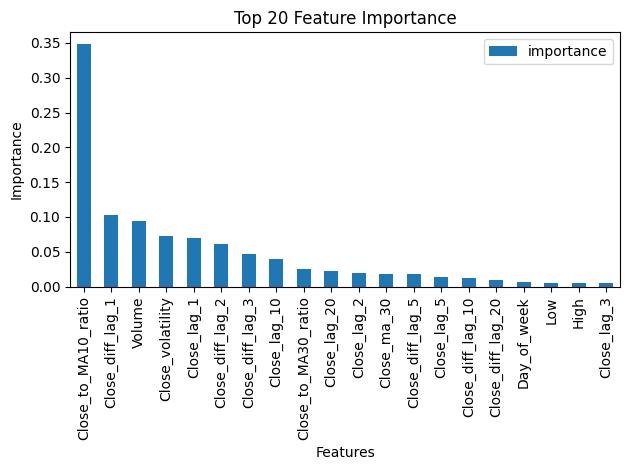

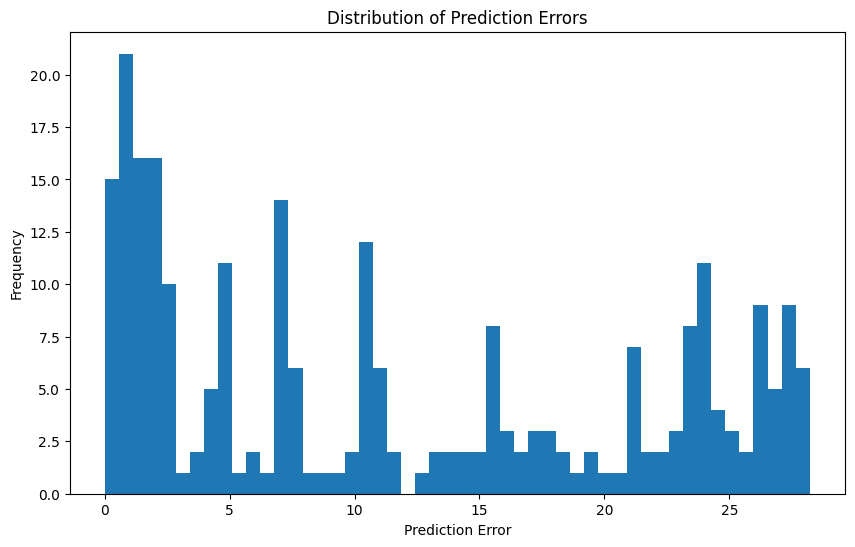

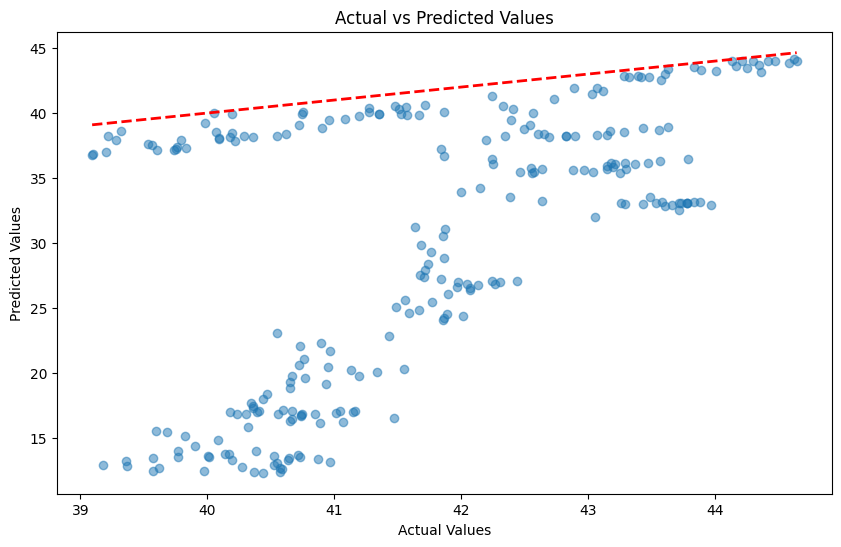

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from scipy.stats import randint, uniform

# データセットの読み込みと前処理
file_path = './ko.us.csv'
data = pd.read_csv(file_path)
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)

# Close価格の差分を計算
data['Close_diff'] = data['Close'].diff()

# Close価格を中心とした特徴量エンジニアリング
for lag in [1, 2, 3, 5, 10, 20]:
    data[f'Close_lag_{lag}'] = data['Close'].shift(lag)
    data[f'Close_diff_lag_{lag}'] = data['Close_diff'].shift(lag)

data['Close_ma_10'] = data['Close'].rolling(window=10).mean()
data['Close_ma_30'] = data['Close'].rolling(window=30).mean()
data['Close_volatility'] = data['Close'].rolling(window=10).std()

# 比率特徴量の追加
data['Close_to_MA10_ratio'] = data['Close'] / data['Close_ma_10']
data['Close_to_MA30_ratio'] = data['Close'] / data['Close_ma_30']

# 追加の特徴量
data['Day_of_week'] = data.index.dayofweek
data['Month'] = data.index.month
data['Quarter'] = data.index.quarter

data = data.dropna()

# データの分割
train_data = data.loc['2010-01-01':'2015-12-31']
test_data = data.loc['2016-01-01':'2016-12-31']

feature_columns = [col for col in data.columns if col not in ['Close', 'Close_diff']]
X_train = train_data[feature_columns]
y_train = train_data['Close_diff']
X_test = test_data[feature_columns]
y_test = test_data['Close_diff']

# スケーリング
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 指数関数的な重み付けを行う関数
def exponential_weights(n_samples, decay_factor=0.01):
    weights = np.exp(np.arange(n_samples) * decay_factor)
    return weights / np.sum(weights)

# 重み付けの適用
sample_weights = exponential_weights(len(y_train), decay_factor=0.01)

# Gradient Boosting Regressorのハイパーパラメータ設定
param_distributions = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(3, 20),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 20),
    'learning_rate': uniform(0.01, 0.3),
    'subsample': uniform(0.6, 0.4),
    'max_features': ['sqrt', 'log2', None]
}

# 時系列交差検証を設定
tscv = TimeSeriesSplit(n_splits=5)

# ランダムサーチによるハイパーパラメータのチューニング
gb = GradientBoostingRegressor(random_state=42)
random_search = RandomizedSearchCV(estimator=gb, param_distributions=param_distributions, 
                                   n_iter=100, cv=tscv, n_jobs=-1, verbose=2, 
                                   scoring='neg_mean_squared_error', random_state=42)
random_search.fit(X_train_scaled, y_train, sample_weight=sample_weights)

# 最適なモデルで予測
best_model = random_search.best_estimator_
diff_predictions = best_model.predict(X_test_scaled)

# 差分予測を実際のClose価格に変換（修正版）
last_train_close = train_data['Close'].iloc[-1]
predictions = last_train_close + np.cumsum(diff_predictions)
actual_values = test_data['Close']

# 予測と実際のデータのプロット（テスト期間のみ）
plt.figure(figsize=(12,6))
plt.plot(test_data.index, actual_values, label='Actual', alpha=0.7)
plt.plot(test_data.index, predictions, label='Predictions', color='red', alpha=0.7)
plt.title('Gradient Boosting Model Predictions (Close-Centered)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

# 精度評価
mse = mean_squared_error(actual_values, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual_values, predictions)
r2 = r2_score(actual_values, predictions)
print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')
print(f'Mean Absolute Error: {mae}')
print(f'R-squared: {r2}')

# 最適なパラメータの表示
print("Best parameters:", random_search.best_params_)

# 特徴量の重要度を表示
feature_importance = pd.DataFrame({'feature': X_train.columns, 'importance': best_model.feature_importances_})
feature_importance = feature_importance.sort_values('importance', ascending=False)
print("\nFeature Importance:")
print(feature_importance)

# 特徴量の重要度をプロット
plt.figure(figsize=(10, 6))
feature_importance.head(20).plot(x='feature', y='importance', kind='bar')
plt.title('Top 20 Feature Importance')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# 予測誤差の分布をプロット
errors = actual_values - predictions
plt.figure(figsize=(10, 6))
plt.hist(errors, bins=50)
plt.title('Distribution of Prediction Errors')
plt.xlabel('Prediction Error')
plt.ylabel('Frequency')
plt.show()

# 実際の値と予測値の散布図
plt.figure(figsize=(10, 6))
plt.scatter(actual_values, predictions, alpha=0.5)
plt.plot([actual_values.min(), actual_values.max()], [actual_values.min(), actual_values.max()], 'r--', lw=2)
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

Fitting 5 folds for each of 100 candidates, totalling 500 fits


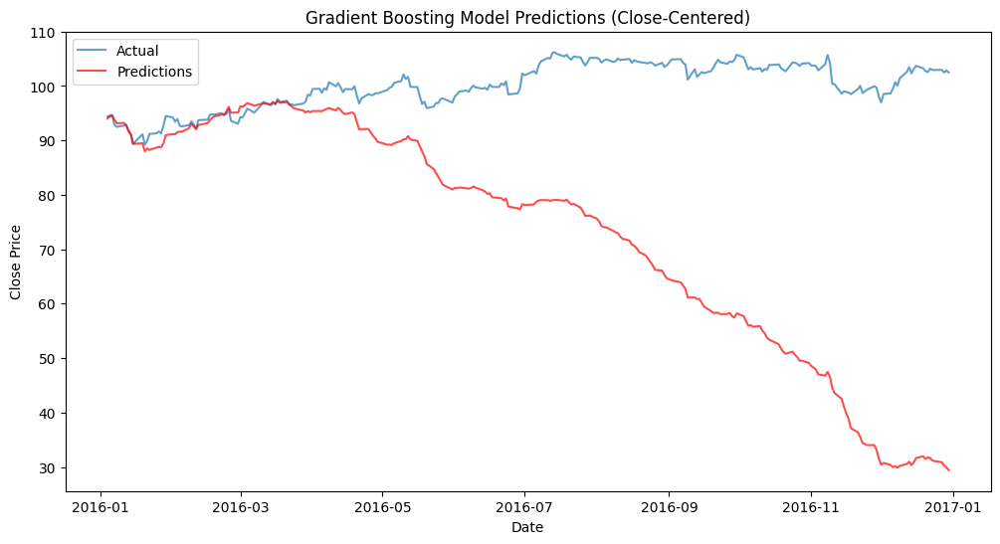

Mean Squared Error: 1303.4476042793253
Root Mean Squared Error: 36.10329076800791
Mean Absolute Error: 27.308124005019707
R-squared: -75.6733648130254
Best parameters: {'learning_rate': 0.1370204442119109, 'max_depth': 3, 'max_features': None, 'min_samples_leaf': 11, 'min_samples_split': 18, 'n_estimators': 491, 'subsample': 0.8916028672163949}

Feature Importance:
                feature  importance
0                  Open         NaN
1                  High         NaN
2                   Low         NaN
3                Volume         NaN
4               OpenInt         NaN
5           Close_lag_1         NaN
6      Close_diff_lag_1         NaN
7           Close_lag_2         NaN
8      Close_diff_lag_2         NaN
9           Close_lag_3         NaN
10     Close_diff_lag_3         NaN
11          Close_lag_5         NaN
12     Close_diff_lag_5         NaN
13         Close_lag_10         NaN
14    Close_diff_lag_10         NaN
15         Close_lag_20         NaN
16    Close_diff_lag

<Figure size 1000x600 with 0 Axes>

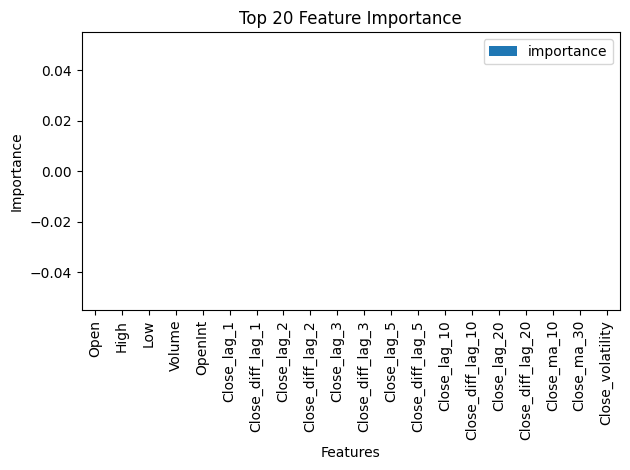

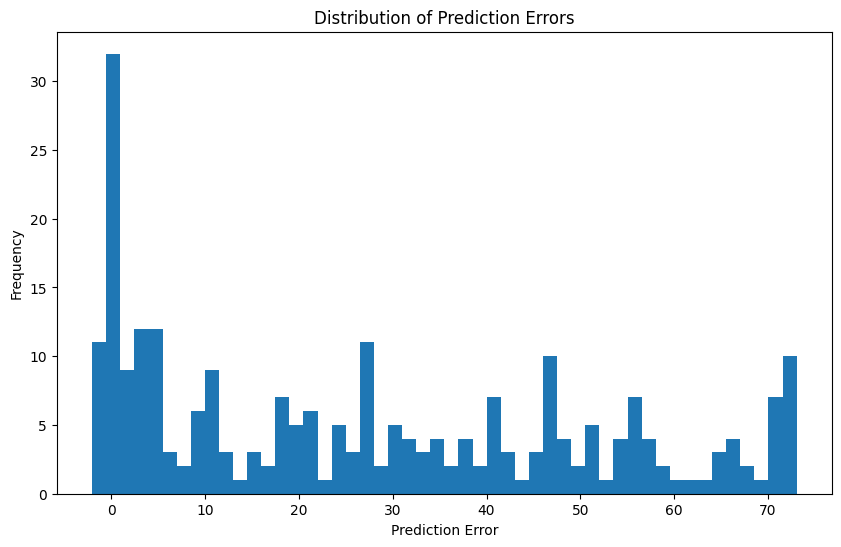

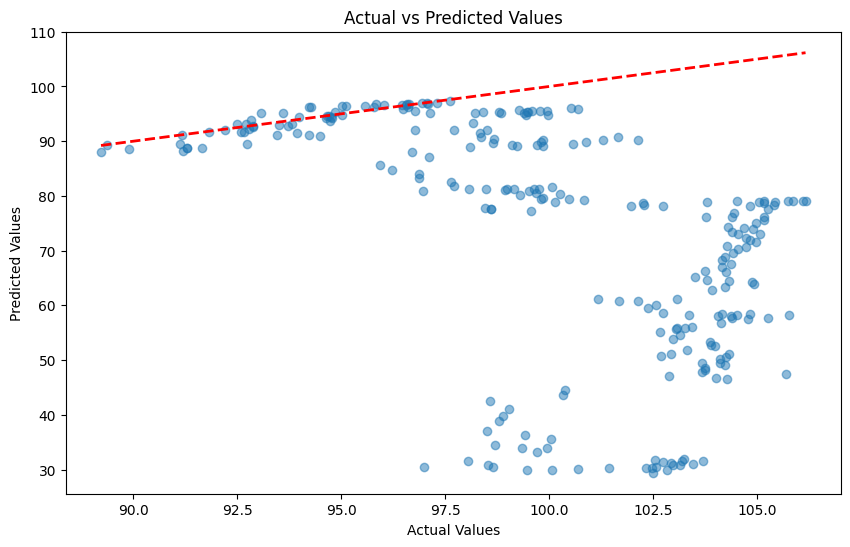

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from scipy.stats import randint, uniform

# データセットの読み込みと前処理
file_path = './pep.us.csv'
data = pd.read_csv(file_path)
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)

# Close価格の差分を計算
data['Close_diff'] = data['Close'].diff()

# Close価格を中心とした特徴量エンジニアリング
for lag in [1, 2, 3, 5, 10, 20]:
    data[f'Close_lag_{lag}'] = data['Close'].shift(lag)
    data[f'Close_diff_lag_{lag}'] = data['Close_diff'].shift(lag)

data['Close_ma_10'] = data['Close'].rolling(window=10).mean()
data['Close_ma_30'] = data['Close'].rolling(window=30).mean()
data['Close_volatility'] = data['Close'].rolling(window=10).std()

# 比率特徴量の追加
data['Close_to_MA10_ratio'] = data['Close'] / data['Close_ma_10']
data['Close_to_MA30_ratio'] = data['Close'] / data['Close_ma_30']

# 追加の特徴量
data['Day_of_week'] = data.index.dayofweek
data['Month'] = data.index.month
data['Quarter'] = data.index.quarter

data = data.dropna()

# データの分割
train_data = data.loc['2000-01-01':'2015-12-31']
test_data = data.loc['2016-01-01':'2016-12-31']

feature_columns = [col for col in data.columns if col not in ['Close', 'Close_diff']]
X_train = train_data[feature_columns]
y_train = train_data['Close_diff']
X_test = test_data[feature_columns]
y_test = test_data['Close_diff']

# スケーリング
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 指数関数的な重み付けを行う関数
def exponential_weights(n_samples, decay_factor=0.01):
    weights = np.exp(np.arange(n_samples) * decay_factor)
    return weights / np.sum(weights)

# 重み付けの適用
sample_weights = exponential_weights(len(y_train), decay_factor=0.01)

# Gradient Boosting Regressorのハイパーパラメータ設定
param_distributions = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(3, 20),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 20),
    'learning_rate': uniform(0.01, 0.3),
    'subsample': uniform(0.6, 0.4),
    'max_features': ['sqrt', 'log2', None]
}

# 時系列交差検証を設定
tscv = TimeSeriesSplit(n_splits=5)

# ランダムサーチによるハイパーパラメータのチューニング
gb = GradientBoostingRegressor(random_state=42)
random_search = RandomizedSearchCV(estimator=gb, param_distributions=param_distributions, 
                                   n_iter=100, cv=tscv, n_jobs=-1, verbose=2, 
                                   scoring='neg_mean_squared_error', random_state=42)
random_search.fit(X_train_scaled, y_train, sample_weight=sample_weights)

# 最適なモデルで予測
best_model = random_search.best_estimator_
diff_predictions = best_model.predict(X_test_scaled)

# 差分予測を実際のClose価格に変換（修正版）
last_train_close = train_data['Close'].iloc[-1]
predictions = last_train_close + np.cumsum(diff_predictions)
actual_values = test_data['Close']

# 予測と実際のデータのプロット（テスト期間のみ）
plt.figure(figsize=(12,6))
plt.plot(test_data.index, actual_values, label='Actual', alpha=0.7)
plt.plot(test_data.index, predictions, label='Predictions', color='red', alpha=0.7)
plt.title('Gradient Boosting Model Predictions (Close-Centered)')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

# 精度評価
mse = mean_squared_error(actual_values, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual_values, predictions)
r2 = r2_score(actual_values, predictions)
print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')
print(f'Mean Absolute Error: {mae}')
print(f'R-squared: {r2}')

# 最適なパラメータの表示
print("Best parameters:", random_search.best_params_)

# 特徴量の重要度を表示
feature_importance = pd.DataFrame({'feature': X_train.columns, 'importance': best_model.feature_importances_})
feature_importance = feature_importance.sort_values('importance', ascending=False)
print("\nFeature Importance:")
print(feature_importance)

# 特徴量の重要度をプロット
plt.figure(figsize=(10, 6))
feature_importance.head(20).plot(x='feature', y='importance', kind='bar')
plt.title('Top 20 Feature Importance')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# 予測誤差の分布をプロット
errors = actual_values - predictions
plt.figure(figsize=(10, 6))
plt.hist(errors, bins=50)
plt.title('Distribution of Prediction Errors')
plt.xlabel('Prediction Error')
plt.ylabel('Frequency')
plt.show()

# 実際の値と予測値の散布図
plt.figure(figsize=(10, 6))
plt.scatter(actual_values, predictions, alpha=0.5)
plt.plot([actual_values.min(), actual_values.max()], [actual_values.min(), actual_values.max()], 'r--', lw=2)
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()